# Unpaired Image-to-Image Translation using CycleGAN 

In [2]:
import os
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


In [3]:
!mkdir ~/.kaggle

mkdir: /Users/sohanrk/.kaggle: File exists


In [4]:
!cp /Users/sohanrk/Downloads/kaggle.json /Users/sohanrk/.kaggle/kaggle.json

In [5]:
!cd  /Users/sohanrk/.kaggle/ && ls

kaggle.json


In [6]:
!kaggle competitions download -c gan-getting-started


gan-getting-started.zip: Skipping, found more recently modified local copy (use --force to force download)


#### Imports

In [3]:
import os
import cv2

import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.layers as tfl
import tensorflow_addons as tfa

AUTOTUNE = tf.data.experimental.AUTOTUNE

import matplotlib.pyplot as plt
import numpy as np
from matplotlib import image as Image

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)


Number of replicas: 1


/Users/sohanrk/Applications/anaconda3/envs/ece-5831-2023/lib/python3.8/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


#### EDA

In [5]:
path = './'
monet_filenames = tf.io.gfile.glob(str(path + '/monet_tfrec/*.tfrec'))
print('Monet TFRecord Files:', len(monet_filenames))
photo_filenames = tf.io.gfile.glob(str(path + '/photo_tfrec/*.tfrec'))
print('Photo TFRecord Files:', len(monet_filenames))

Monet TFRecord Files: 5
Photo TFRecord Files: 5


In [6]:
monet_filenames[2]

'.//monet_tfrec/monet08-60.tfrec'

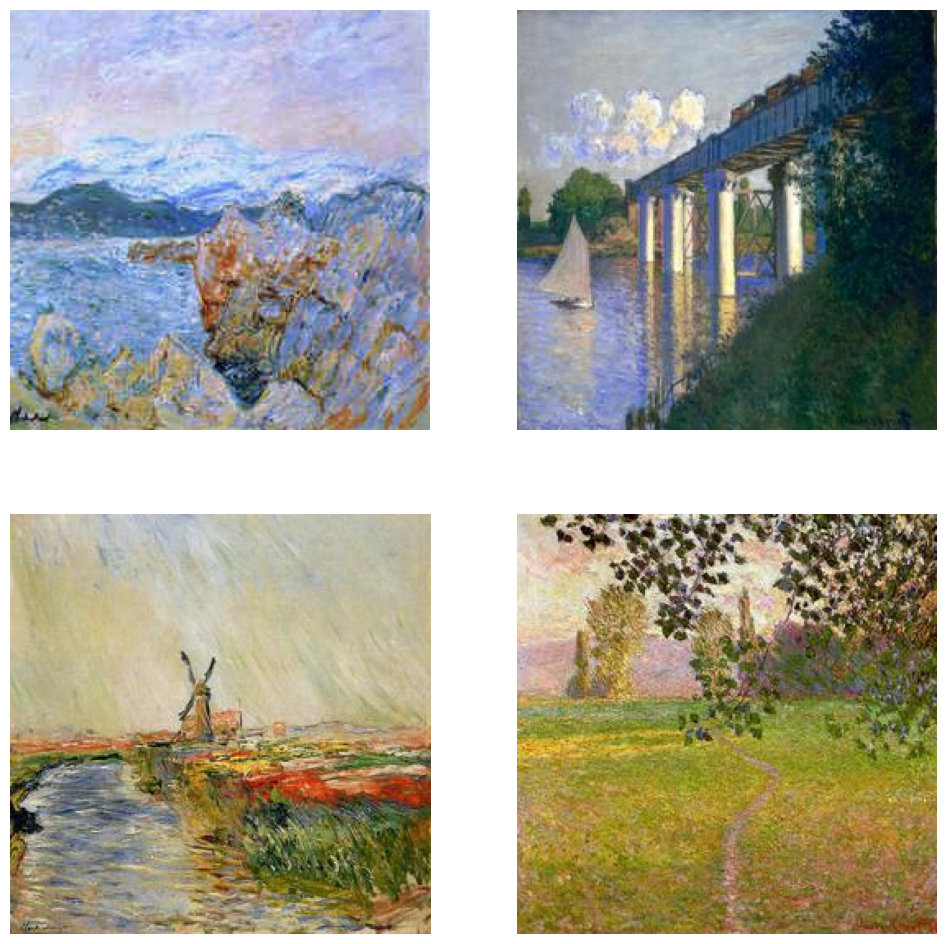

In [7]:
import os
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread

# Path to the 'monet_jpg' folder
folder_path = './monet_jpg'

# Get a list of all image files in the folder
image_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.jpg')]

# Randomly select 4 images
random_images = random.sample(image_files, 4)

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Loop through the randomly selected image files and plot them in the subplots
for i, ax in enumerate(axes.flat):
    image = imread(random_images[i])
    ax.imshow(image)
    ax.axis('off')

# Show the plot
plt.show()


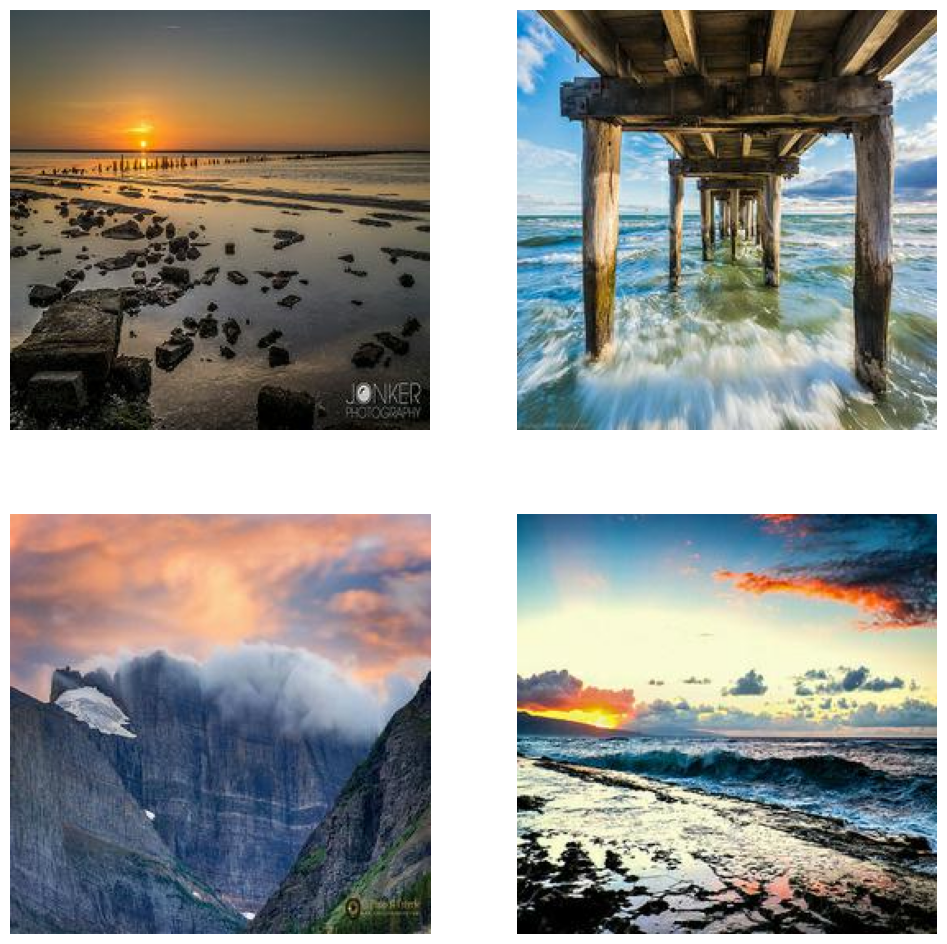

In [8]:
folder_path = './photo_jpg'

# Get a list of all image files in the folder
image_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.jpg')]

# Randomly select 4 images
random_images = random.sample(image_files, 4)

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Loop through the randomly selected image files and plot them in the subplots
for i, ax in enumerate(axes.flat):
    image = imread(random_images[i])
    ax.imshow(image)
    ax.axis('off')

# Show the plot
plt.show()


In [9]:
monet_jpg_filepath = "./monet_jpg"
photo_jpg_filepath = "./photo_jpg"

In [10]:
monet_image_paths = []
for dirname, _, filenames in os.walk(monet_jpg_filepath):
    for filename in filenames:
        fullpath = os.path.join(dirname, filename)
        monet_image_paths.append(fullpath)
monet_image_paths[:5]

['./monet_jpg/1f22663e72.jpg',
 './monet_jpg/50855dd324.jpg',
 './monet_jpg/66a144f547.jpg',
 './monet_jpg/463835bbc6.jpg',
 './monet_jpg/2acfbab228.jpg']

In [11]:
image_path = []
for dirname, _, filenames in os.walk(photo_jpg_filepath):
    for filename in filenames:
        fullpath = os.path.join(dirname, filename)
        image_path.append(fullpath)
image_path[:5]

['./photo_jpg/5a384bf8d9.jpg',
 './photo_jpg/bb15fcc4ff.jpg',
 './photo_jpg/39c1270676.jpg',
 './photo_jpg/506fdcb3c1.jpg',
 './photo_jpg/63f6cea734.jpg']

#### EDA Summary

In [12]:
print('Number of Actual Images:', len(image_path))
print('Number of Monet Images:', len(monet_image_paths))

Number of Actual Images: 7038
Number of Monet Images: 300


#### Image Preprocessing

In [13]:
image_shape = [256,256]
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*image_shape, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

In [14]:
#Here we will load the dataset and use Autotune to fetch the batch dataset more efficiently

def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls = AUTOTUNE)
    return dataset

In [15]:
monet = load_dataset(monet_filenames, labeled=True).batch(1)
photo = load_dataset(photo_filenames, labeled=True).batch(1)


2023-12-10 13:50:00.009605: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2023-12-10 13:50:00.009666: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-12-10 13:50:00.009672: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-12-10 13:50:00.009838: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-12-10 13:50:00.009916: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


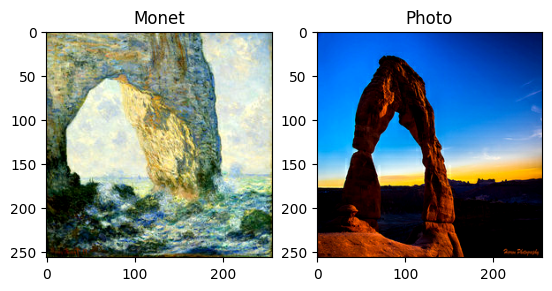

In [16]:
plt.subplot(121)
plt.title('Monet')
plt.imshow(next(iter(monet))[0]*0.6 + 0.5)

plt.subplot(122)
plt.title('Photo')
plt.imshow(next(iter(photo))[0]*0.6 + 0.5)

#### Downsamoling the images for the Generator

In [17]:
output_channels = 3

#In downsample we will use Conv2D to reduce the size of the image

def downsample(filters, size, instancenorm = True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    model = keras.Sequential()
    model.add(tfl.Conv2D(filters = filters, kernel_size = size, strides = 2, padding='same',
                             kernel_initializer = initializer, use_bias=False))

    if instancenorm:
        model.add(tfa.layers.InstanceNormalization(gamma_initializer = gamma_init))

    model.add(tfl.LeakyReLU())

    return model

#### Upsampling the images for the Discriminator

In [18]:
# In upsample we will use Conv2DTranspose to increase the size of the image, stride = 2 will increase the dimension by twice

def upsample(filters, size, dropout = False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    model = keras.Sequential()
    model.add(tfl.Conv2DTranspose(filters = filters, kernel_size = size, strides = 2,
                                      padding = 'same',
                                      kernel_initializer = initializer,
                                      use_bias = False))

    model.add(tfa.layers.InstanceNormalization(gamma_initializer = gamma_init))

    if dropout:
        model.add(tfl.Dropout(0.5)) #We tried to change dropout to 0.2 but it was throwing an error

    model.add(tfl.ReLU())

    return model

#### Building the Generator and the Discriminator

In [19]:
def Generator():
    inputs = tfl.Input(shape=[256,256,3])

    down_stack = [
        downsample(filters = 64, size = 4, instancenorm = False), # Every Downstack layer has stride = 2
        downsample(filters = 128, size = 4),
        downsample(filters = 256, size = 4),
        downsample(filters = 512, size = 4),
        downsample(filters = 512, size = 4),
        downsample(filters = 512, size = 4),
        downsample(filters = 512, size = 4),
        downsample(filters = 512, size = 4),
    ]

    up_stack = [
        upsample(filters = 512, size = 4, dropout = True), # (bs, 2, 2, 1024)
        upsample(filters = 512, size = 4, dropout = True), # (bs, 4, 4, 1024)
        upsample(filters = 512, size = 4, dropout = True), # (bs, 8, 8, 1024)
        upsample(filters = 512, size = 4), # (bs, 16, 16, 1024)
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last_layer = tfl.Conv2DTranspose(output_channels, kernel_size = 4, strides = 2, padding='same',
                                  kernel_initializer = initializer,
                                  activation = 'tanh')

    x = inputs

    # Downsampling through the model
    skips = []
    for down_layer in down_stack:
        x = down_layer(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tfl.Concatenate()([x, skip])

    x = last_layer(x)

    return keras.Model(inputs = inputs, outputs = x)

In [20]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    x = tfl.Input(shape=[256, 256, 3])
    
    
    #Down layers are Conv2D layers with their own initializers and leakyReLU activation
    
    down_layer_1 = downsample(filters = 64, size = 4,instancenorm = False)(x)
    down_layer_2 = downsample(filters = 128, size = 4)(down_layer_1)
    down_layer_3 = downsample(filters = 256, size = 4)(down_layer_2) 

    zero_pad1 = tfl.ZeroPadding2D(padding = 2)(down_layer_3)
    conv_layer_1 = tfl.Conv2D(filters = 512, kernel_size = 4, strides = 2,
                         kernel_initializer = initializer, use_bias=False)(zero_pad1)

    norm_1 = tfa.layers.InstanceNormalization(gamma_initializer = gamma_init)(conv_layer_1)

    leaky_relu_1 = tfl.LeakyReLU()(norm_1)

    zero_pad2 = tfl.ZeroPadding2D()(leaky_relu_1)
    
    last_layer = tfl.Conv2D(filters = 1, kernel_size = 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) 

    return keras.Model(inputs = x, outputs = last_layer)

In [21]:
with strategy.scope():
    monet_generator = Generator() # transforms photos to Monet-esque paintings
    photo_generator = Generator() # transforms Monet paintings to be more like photos

    monet_discriminator = Discriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator = Discriminator() # differentiates real photos and generated photos

#### CycleGAN Class

In [22]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

#### MODEL LOSS

In [23]:
with strategy.scope():
    def discriminator_loss(real, generated):
        
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True, 
                                                           reduction = tf.keras.losses.Reduction.NONE)
        
        # Loss for discriminator includes two parts, first where it tries to flag real image as real
        # Second part where it try to minimize flagging generated images as real
        
        real_loss = cross_entropy(tf.ones_like(real), real)
        fake_loss = cross_entropy(tf.zeros_like(generated), generated)

        total_loss = real_loss + fake_loss

        return total_loss*0.5


In [24]:
with strategy.scope():
    def generator_loss(generated):
        
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True, 
                                                           reduction = tf.keras.losses.Reduction.NONE)
        #For generator we have only one term for loss
        
        return cross_entropy(tf.ones_like(generated), generated)

In [25]:
with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):

        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
        
        return LAMBDA*loss1
    

In [26]:
with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        
        return LAMBDA*0.5*loss

In [27]:
with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001, beta_1=0.5)

In [28]:
with strategy.scope():
    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

In [36]:
history_gan = cycle_gan_model.fit(
    tf.data.Dataset.zip((monet, photo)),
    epochs = 20
)

Epoch 1/20
300/300 [==============================] - 131s 434ms/step - monet_gen_loss: 3.8524 - photo_gen_loss: 4.0853 - monet_disc_loss: 0.5848 - photo_disc_loss: 0.4890
Epoch 2/20


2023-12-10 14:15:30.941404: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 46139399925028079
2023-12-10 14:15:30.941431: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 14899375676742325953
2023-12-10 14:15:30.941447: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 522928340899702619
2023-12-10 14:15:30.941458: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 10861787672466340459
2023-12-10 14:15:30.941465: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 2663616405165423801
2023-12-10 14:15:30.941521: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 10744731103772524101
2023-12-10 14:15:30.941537: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv ite

300/300 [==============================] - 130s 433ms/step - monet_gen_loss: 3.9561 - photo_gen_loss: 4.1461 - monet_disc_loss: 0.5611 - photo_disc_loss: 0.5269
Epoch 3/20
300/300 [==============================] - 129s 431ms/step - monet_gen_loss: 4.0075 - photo_gen_loss: 4.1837 - monet_disc_loss: 0.5585 - photo_disc_loss: 0.5217
Epoch 4/20
300/300 [==============================] - 129s 431ms/step - monet_gen_loss: 3.9735 - photo_gen_loss: 4.1459 - monet_disc_loss: 0.6008 - photo_disc_loss: 0.5569
Epoch 5/20
300/300 [==============================] - 129s 431ms/step - monet_gen_loss: 3.8711 - photo_gen_loss: 4.0698 - monet_disc_loss: 0.6001 - photo_disc_loss: 0.5580
Epoch 6/20
300/300 [==============================] - 129s 431ms/step - monet_gen_loss: 3.7692 - photo_gen_loss: 3.9536 - monet_disc_loss: 0.6001 - photo_disc_loss: 0.5599
Epoch 7/20
300/300 [==============================] - 129s 431ms/step - monet_gen_loss: 3.6505 - photo_gen_loss: 3.8594 - monet_disc_loss: 0.6104 - pho

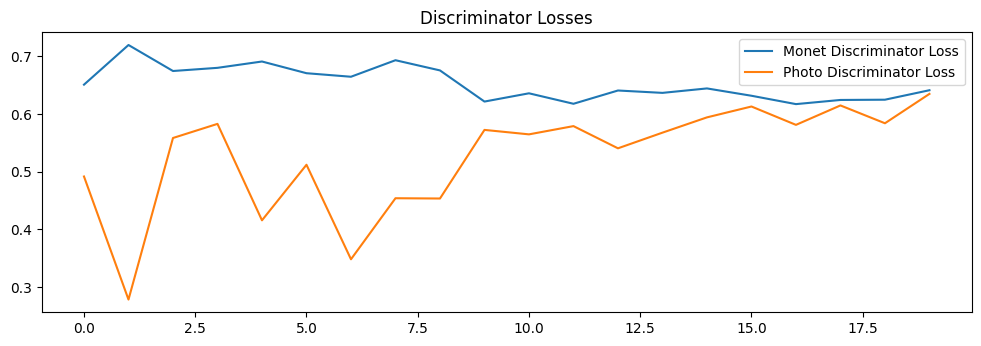

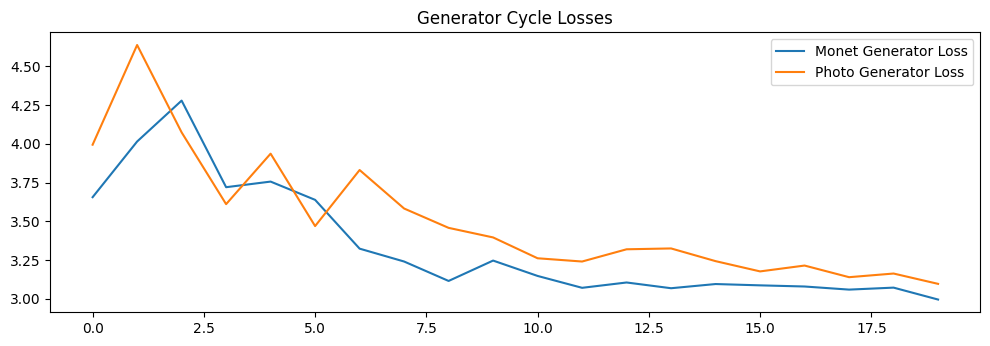

In [38]:
import numpy as np
import matplotlib.pyplot as plt

# Plotting losses
def plot_losses(history_gan):
    plt.figure(figsize=(12, 8))

    monet_disc_loss = [np.mean(loss_array) for loss_array in history_gan.history['monet_disc_loss']]
    photo_disc_loss = [np.mean(loss_array) for loss_array in history_gan.history['photo_disc_loss']]

    # Plotting losses for discriminator
    plt.subplot(2, 1, 1)
    plt.plot(monet_disc_loss, label='Monet Discriminator Loss')
    plt.plot(photo_disc_loss, label='Photo Discriminator Loss')
    plt.legend()
    plt.title('Discriminator Losses')

    plt.show()

    # Plotting losses for generator
    monet_gen_loss = [np.mean(loss_array) for loss_array in history_gan.history['monet_gen_loss']]
    photo_gen_loss = [np.mean(loss_array) for loss_array in history_gan.history['photo_gen_loss']]

    plt.figure(figsize=(12, 8))
    plt.subplot(2, 1, 2)
    plt.plot(monet_gen_loss, label='Monet Generator Loss')
    plt.plot(photo_gen_loss, label='Photo Generator Loss')
    plt.legend()
    plt.title('Generator Cycle Losses')

    plt.show()

# Call the function to plot losses
plot_losses(history_gan)


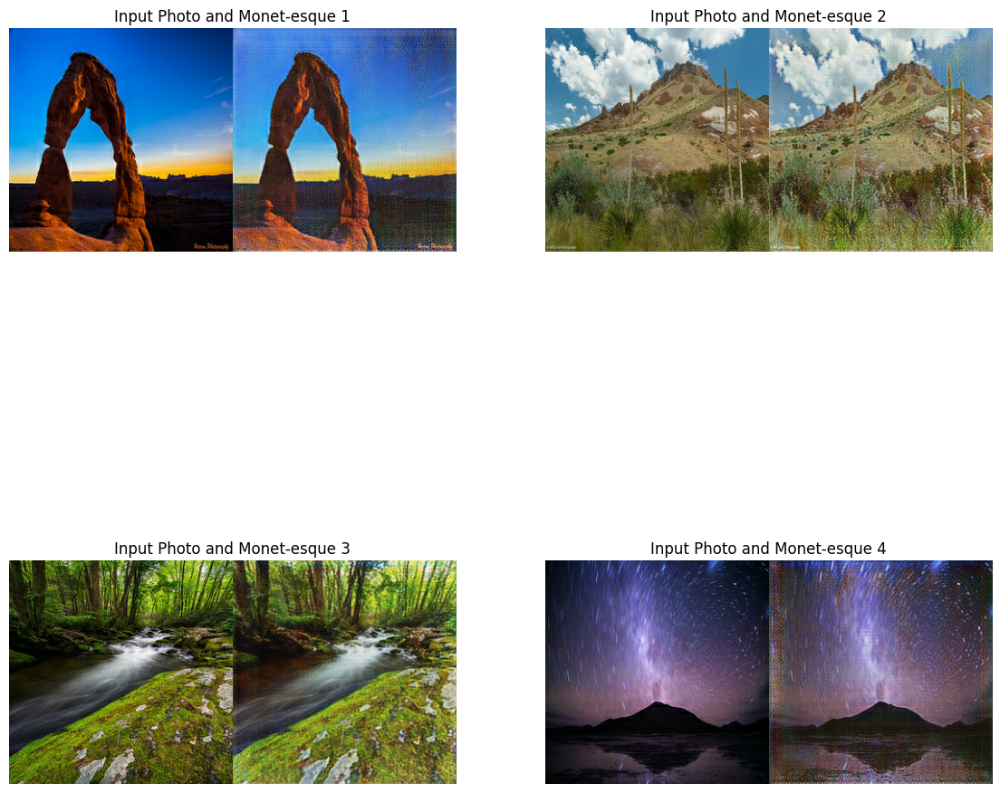

In [51]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'photo' is a dataset containing input images and 'monet_generator' is your generator model

# Select a random set of input images
random_photo_samples = list(photo.take(4).as_numpy_iterator())

# Generate Monet-esque images from the selected input samples
generated_monet_images = [monet_generator(img, training=False)[0].numpy() for img in random_photo_samples]

# Plotting the images in a 2x2 grid
_, ax = plt.subplots(2, 2, figsize=(14, 14))

for i in range(2):
    for j in range(2):
        # Convert the images to uint8 for display
        input_img = (random_photo_samples[i * 2 + j][0] * 127.5 + 127.5).astype(np.uint8)
        generated_img = (generated_monet_images[i * 2 + j] * 127.5 + 127.5).astype(np.uint8)

        # Display the input photo on the left and the generated Monet-esque image on the right
        ax[i, j].imshow(np.concatenate([input_img, generated_img], axis=1))
        ax[i, j].set_title(f"Input Photo and Monet-esque {i * 2 + j + 1}")

# Remove axis labels and display the plot
for ax in ax.flatten():
    ax.axis("off")

plt.show()


## Model 2

In [264]:

%matplotlib inline
import warnings
warnings.simplefilter(action='ignore', category=(RuntimeWarning, FutureWarning, UserWarning))

import gc
import time
import os
import urllib.request
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import zipfile
from io import BytesIO
from matplotlib.pyplot import subplots
import tensorflow as tf
import keras
from keras import layers, Model
from keras.models import Sequential
from keras.layers import Layer, Dense, Activation, Dropout, Input, concatenate, Average, Concatenate, Conv2D, Conv2DTranspose, BatchNormalization, ReLU, LeakyReLU, ZeroPadding2D, GaussianNoise
from keras.optimizers import Adam
from keras.utils import array_to_img
from keras.callbacks import Callback
from keras.initializers import RandomNormal
from keras.losses import BinaryCrossentropy

In [265]:
import urllib.request
url = 'https://raw.githubusercontent.com/mit-han-lab/data-efficient-gans/master/DiffAugment-stylegan2/DiffAugment_tf.py'
filename = 'DiffAugment_tf.py'
urllib.request.urlretrieve(url, filename)
import DiffAugment_tf

In [266]:
def diffaug_fn(image):
    return DiffAugment_tf.DiffAugment(image, "color,translation,cutout")

In [267]:
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

In [268]:
def downsample2(filters, size, apply_instancenorm=True, add_noise=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = keras.Sequential()
    result.add(Conv2D(filters, size, strides=2, padding='same',
                      kernel_initializer=initializer, use_bias=False))
    if add_noise:
        result.add(GaussianNoise(0.2))
    if apply_instancenorm:
        result.add(InstanceNormalization())
    result.add(tfl.LeakyReLU())
    return result

def upsample2(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides=2,
                               padding='same',
                               kernel_initializer=initializer,
                               use_bias=False))
    result.add(InstanceNormalization())
    if apply_dropout:
        result.add(Dropout(0.5))
    result.add(ReLU())
    return result

In [269]:
def create_generator():
    inputs = Input(shape=[256,256,3])
    output_channels = 3

    down_stack = [
        downsample2(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample2(128, 4), # (bs, 64, 64, 128)
        downsample2(256, 4), # (bs, 32, 32, 256)
        downsample2(512, 4), # (bs, 16, 16, 512)
        downsample2(512, 4), # (bs, 8, 8, 512)
        downsample2(512, 4), # (bs, 4, 4, 512)
        downsample2(512, 4), # (bs, 2, 2, 512)
        downsample2(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample2(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample2(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample2(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample2(512, 4), # (bs, 16, 16, 1024)
        upsample2(256, 4), # (bs, 32, 32, 512)
        upsample2(128, 4), # (bs, 64, 64, 256)
        upsample2(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(output_channels, 4,
                           strides=2,
                           padding='same',
                           kernel_initializer=initializer,
                           activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])
    outputs = last(x)
    return keras.Model(inputs=inputs, outputs=outputs)

In [270]:
def create_discriminator(add_noise=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    inputs = Input(shape=[256, 256, 3], name='input_image')
    x = inputs
    x = downsample2(64, 4, False, add_noise=add_noise)(x) # (bs, 128, 128, 64)
    x = downsample2(2128, 4, add_noise=add_noise)(x) # (bs, 64, 64, 128)
    x = downsample2(256, 4, add_noise=add_noise)(x) # (bs, 32, 32, 256)
    x = ZeroPadding2D()(x) # (bs, 34, 34, 256)
    x = Conv2D(512, 4, strides=1,
               kernel_initializer=initializer,
               use_bias=False)(x) # (bs, 31, 31, 512)
    if add_noise:
        x = GaussianNoise(0.2)(x)
    x = InstanceNormalization()(x)
    x = tfl.LeakyReLU()(x)
    x = ZeroPadding2D()(x) # (bs, 33, 33, 512)
    outputs = Conv2D(1, 4, strides=1,
                     kernel_initializer=initializer)(x) # (bs, 30, 30, 1)
    return tf.keras.Model(inputs=inputs, outputs=outputs)

In [271]:
class TrainingGAN(keras.Model):
    def __init__(self, generator_g, discriminator_x, generator_f, discriminator_y,
                 lambda_loss=10, gamma_loss=1e-4, lambda_id_loss=1e-5, diffaug_fn=None, batch_size=32, **kwargs):
        super().__init__(**kwargs)
        self.generator_g = generator_g
        self.generator_f = generator_f
        self.discriminator_x = discriminator_x
        self.discriminator_y = discriminator_y
        self.lambda_loss = lambda_loss
        self.gamma_loss = gamma_loss
        self.lambda_id_loss = lambda_id_loss
        self.diffaug_fn = diffaug_fn
        disc_inputs = Input(shape=[None, None, 3], name='input_image')
        self.discriminator_features_x = keras.Model(inputs=self.discriminator_x.input,
                                              outputs=self.discriminator_x.layers[-2].output)
        self.discriminator_features_y = keras.Model(inputs=self.discriminator_y.input,
                                              outputs=self.discriminator_y.layers[-2].output)

    def compile(self, generator_g_optimizer, discriminator_x_optimizer,
                generator_f_optimizer, discriminator_y_optimizer):
        super().compile()
        self.generator_g_optimizer = generator_g_optimizer
        self.discriminator_x_optimizer = discriminator_x_optimizer
        self.generator_f_optimizer = generator_f_optimizer
        self.discriminator_y_optimizer = discriminator_y_optimizer

    def _discriminator_bce_loss(self, real, generated):
        real_loss = BinaryCrossentropy(
            from_logits=True,
            reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)
        real_loss = tf.reduce_mean(real_loss)
        generated_loss = BinaryCrossentropy(
            from_logits=True,
            reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
        generated_loss = tf.reduce_mean(generated_loss)
        total_disc_loss = real_loss + generated_loss
        return total_disc_loss * 0.5

    def _generator_bce_loss(self, generated):
        loss = BinaryCrossentropy(
            from_logits=True,
            reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)
        loss = tf.reduce_mean(loss)
        return loss

    def _cycle_loss(self, real_image, cycled_image):
        loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
        return loss

    def _identity_loss(self, real_image, same_image):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return 0.5 * loss

    @tf.function
    def train_step(self, batch):
        (real_x, real_y) = batch
        batch_size = tf.shape(real_y)[0]
        with tf.GradientTape(persistent=True) as tape:
            fake_y = self.generator_g(real_x, training=True)
            cycled_x = self.generator_f(fake_y, training=True)
            fake_x = self.generator_f(real_y, training=True)
            cycled_y = self.generator_g(fake_x, training=True)
            same_x = self.generator_f(real_x, training=True)
            same_y = self.generator_g(real_y, training=True)

            if self.diffaug_fn:
                both_y = tf.concat([real_y, fake_y], axis=0)
                aug_y = self.diffaug_fn(both_y)
                aug_real_y = aug_y[:batch_size]
                aug_fake_y = aug_y[batch_size:]
                disc_real_y = self.discriminator_y(aug_real_y, training=True)
                disc_fake_y = self.discriminator_y(aug_fake_y, training=True)
            else:
                disc_real_y = self.discriminator_y(real_y, training=True)
                disc_fake_y = self.discriminator_y(fake_y, training=True)

            disc_real_x = self.discriminator_x(real_x, training=True)
            disc_fake_x = self.discriminator_x(fake_x, training=True)

            disc_feat_x = self.discriminator_features_x(real_x, training=True)
            disc_feat_cycled_x = self.discriminator_features_x(cycled_x, training=True)
            disc_feat_y = self.discriminator_features_x(real_y, training=True)
            disc_feat_cycled_y = self.discriminator_features_x(cycled_y, training=True)

            gen_g_loss = self._generator_bce_loss(disc_fake_y)
            gen_f_loss = self._generator_bce_loss(disc_fake_x)
            cycle_loss_x = ((1 - self.gamma_loss) * self._cycle_loss(real_x, cycled_x) +
                            self.gamma_loss * self._cycle_loss(disc_feat_x, disc_feat_cycled_x))
            cycle_loss_y = ((1 - self.gamma_loss) *  self._cycle_loss(real_y, cycled_y) +
                            self.gamma_loss * self._cycle_loss(disc_feat_y, disc_feat_cycled_y))
            total_cycle_loss = self.lambda_loss * (cycle_loss_x + cycle_loss_y)
            id_loss_y = self.lambda_id_loss * self._identity_loss(real_y, same_y)
            id_loss_x = self.lambda_id_loss * self._identity_loss(real_x, same_x)
            total_gen_g_loss = gen_g_loss + total_cycle_loss + id_loss_y
            total_gen_f_loss = gen_f_loss + total_cycle_loss + id_loss_x

            disc_x_loss = self._discriminator_bce_loss(disc_real_x, disc_fake_x)
            disc_y_loss = self._discriminator_bce_loss(disc_real_y, disc_fake_y)

        generator_g_gradients = tape.gradient(total_gen_g_loss, self.generator_g.trainable_variables)
        generator_f_gradients = tape.gradient(total_gen_f_loss, self.generator_f.trainable_variables)
        discriminator_x_gradients = tape.gradient(disc_x_loss, self.discriminator_x.trainable_variables)
        discriminator_y_gradients = tape.gradient(disc_y_loss, self.discriminator_y.trainable_variables)

        self.generator_g_optimizer.apply_gradients(zip(generator_g_gradients, self.generator_g.trainable_variables))
        self.generator_f_optimizer.apply_gradients(zip(generator_f_gradients, self.generator_f.trainable_variables))
        self.discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, self.discriminator_x.trainable_variables))
        self.discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, self.discriminator_y.trainable_variables))

        return {
            "disc_x_loss": disc_x_loss,
            "disc_y_loss": disc_y_loss,
            "total_gen_g_loss": total_gen_g_loss,
            "total_gen_f_loss": total_gen_f_loss,
            "gen_g_loss": cycle_loss_x,
            "gen_f_loss": cycle_loss_y,
            }

In [272]:
import matplotlib.pyplot as plt

class PlotPredictionsCallback(keras.callbacks.Callback):
    def __init__(self, input_image, model_generator, epoch_interval=None, nrows=1, figsize=(11, 11)):
        self.input_image = input_image
        self.model_generator = model_generator
        self.epoch_interval = epoch_interval
        self.nrows = nrows
        self.figsize=(11, 11)

    def _plot_test_and_pred(self):
        preds = self.model_generator.predict(self.input_image, verbose=0)
        (fig, axes) = subplots(nrows=self.nrows, ncols=2, figsize=self.figsize)
        if self.nrows == 1:
            axes = [axes]
        for (ax, inp, pred) in zip(axes, self.input_image, preds):
            ax[0].imshow(array_to_img(inp))
            ax[0].set_title("Input Image")
            ax[0].set_axis_off()
            ax[1].imshow(array_to_img(pred))
            ax[1].set_title("Prediction")
            ax[1].set_axis_off()
        plt.show()

    def on_epoch_end(self, epoch, logs=None):
        if self.epoch_interval and epoch % self.epoch_interval == 0:
            self._plot_test_and_pred()

    def on_train_end(self, logs=None):
        self._plot_test_and_pred()

In [273]:
class FIDCalculator(object):
    def __init__(self, images_x_ds, images_y_ds, model_generator, fid_model_base):
        self.images_x_ds = images_x_ds
        self.images_y_ds = images_y_ds
        self.model_generator = model_generator
        self.fid_model_base = fid_model_base
        self.initialized = False
        self.history = []

    def init_stat_x(self):
        self.mu_2, self.sigma_2 = self._calculate_activation_statistics_mod(self.images_y_ds, self.fid_model_base)
        self.initialized = True

    def _calculate_activation_statistics_mod(self, images, fid_model):
        act = tf.cast(fid_model.predict(images, verbose=0), tf.float32)
        mu = tf.reduce_mean(act, axis=0)
        mean_x = tf.reduce_mean(act, axis=0, keepdims=True)
        mx = tf.matmul(tf.transpose(mean_x), mean_x)
        vx = tf.matmul(tf.transpose(act), act)/tf.cast(tf.shape(act)[0], tf.float32)
        sigma = vx - mx
        return mu, sigma

    def _calculate_frechet_distance(self, mu_1, sigma_1, mu_2, sigma_2):
        fid_epsilon = 1e-14
        covmean = tf.linalg.sqrtm(tf.cast(tf.matmul(sigma_1, sigma_2), tf.complex64))
        covmean = tf.cast(tf.math.real(covmean), tf.float32)
        tr_covmean = tf.linalg.trace(covmean)
        fid_value = tf.matmul(
            tf.expand_dims(mu_1 - mu_2, axis=0),
            tf.expand_dims(mu_1 - mu_2, axis=1)
            ) + tf.linalg.trace(sigma_1) + tf.linalg.trace(sigma_2) - 2 * tr_covmean
        return fid_value

    def _get_gen_plus_fid_model(self):
        inputs = Input(shape=[256, 256, 3], name='input_image')
        x = self.model_generator(inputs)
        outputs = self.fid_model_base(x)
        fid_model = tf.keras.Model(inputs=inputs, outputs=outputs)
        return fid_model

    def calc_fid(self):
        if not self.initialized:
            self.init_stat_x()
        fid_model_plus = self._get_gen_plus_fid_model()
        mu_1, sigma_1 = self._calculate_activation_statistics_mod(self.images_x_ds, fid_model_plus)
        fid_value = self._calculate_frechet_distance(mu_1, sigma_1, self.mu_2, self.sigma_2)
        return fid_value

In [274]:
def create_fid_inception_model():
    inception_model_base = tf.keras.applications.InceptionV3(
        input_shape=(256,256,3),
        pooling="avg",
        include_top=False)
    mix3  = inception_model_base.get_layer("mixed9").output
    f0 = tf.keras.layers.GlobalAveragePooling2D()(mix3)
    inception_model = tf.keras.Model(inputs=inception_model_base.input, outputs=f0)
    inception_model.trainable = False
    return inception_model

In [275]:
class FIDCallback(keras.callbacks.Callback):
    def __init__(self, fid_calculator, epoch_interval=None):
        self.fid_calculator = fid_calculator
        self.epoch_interval = epoch_interval

    def _get_fid(self):
        fid = self.fid_calculator.calc_fid()
        print("FID score:", fid.numpy()[0,0])

    def on_epoch_end(self, epoch, logs=None):
        if self.epoch_interval and epoch % self.epoch_interval == 0:
            self._get_fid()

    def on_train_end(self, logs=None):
        self._get_fid()

In [276]:
class UpdateLearningRateCallback(keras.callbacks.Callback):
    def __init__(self, epochs_count, lr_start=2e-4, lr_end=5e-6):
        super().__init__()
        self.epoch_min = epochs_count // 2
        epochs_update_count = epochs_count - self.epoch_min
        self.lr_values = np.linspace(lr_start, lr_end, epochs_update_count)

    def _scheduler_fn(self, epoch, lr):
        if epoch < self.epoch_min:
            return lr
        else:
            return self.lr_values[epoch-self.epoch_min]

    def on_epoch_begin(self, epoch, logs=None):
        self.model.generator_g_optimizer.lr = self._scheduler_fn(epoch, self.model.generator_g_optimizer.lr)
        self.model.discriminator_x_optimizer.lr = self._scheduler_fn(epoch, self.model.generator_g_optimizer.lr)
        self.model.generator_f_optimizer.lr = self._scheduler_fn(epoch, self.model.generator_g_optimizer.lr)
        self.model.discriminator_y_optimizer.lr = self._scheduler_fn(epoch, self.model.generator_g_optimizer.lr)

In [277]:
class UpdateLossWeightsCallback(keras.callbacks.Callback):
    def __init__(self, epochs, lambda_start=10, lambda_end=1e-4, gamma_start=1e-4, gamma_end=0.999):
        super().__init__()
        self.epochs = epochs
        self.lambda_start = lambda_start
        self.lambda_end = lambda_end
        self.gamma_start = gamma_start
        self.gamma_end = gamma_end

    def on_train_begin(self, logs=None):
        self.lambda_values = np.linspace(self.lambda_start, self.lambda_end, self.epochs)
        self.gamma_values = np.linspace(self.gamma_start, self.gamma_end, self.epochs)

    def on_epoch_begin(self, epoch, logs=None):
        self.model.lambda_loss = self.lambda_values[epoch]
        self.model.gamma_loss = self.gamma_values[epoch]

Initial Parameters

In [307]:
EPOCHS = 20
STEPS_PER_EPOCH = 300
LAMBDA_START = 3
LAMBDA_END = 1e-4
GAMMA_START = 1e-4
GAMMA_END = 0.999
LAMBDA_ID = 1e-4
EPOCH_INTERVAL_PLOT = 5
EPOCH_INTERVAL_FID = None
LR_START = 2e-4
LR_END = 5e-6

In [308]:
with strategy.scope():
    update_lr_cb = UpdateLearningRateCallback(EPOCHS, lr_start=LR_START, lr_end=LR_END)

In [309]:
with strategy.scope():
    generator_g = create_generator()
    generator_f = create_generator()
    discriminator_x = create_discriminator(add_noise=True)
    discriminator_y = create_discriminator(add_noise=True)

In [310]:
fid_photo_ds = load_dataset(photo_filenames).take(1024).batch(64).prefetch(AUTOTUNE)
fid_monet_ds = load_dataset(monet_filenames).batch(64).prefetch(AUTOTUNE)

In [311]:
with strategy.scope():
    fid_model = create_fid_inception_model()
    fid_calc = FIDCalculator(
        images_x_ds=fid_photo_ds,
        images_y_ds=fid_monet_ds,
        model_generator=generator_g,
        fid_model_base=fid_model)
    fid_calc.init_stat_x()
    fid_cb = FIDCallback(fid_calculator=fid_calc, epoch_interval=EPOCH_INTERVAL_FID)


2023-12-05 18:11:13.461769: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


In [312]:
with strategy.scope():
    update_weights_cb = UpdateLossWeightsCallback(
        EPOCHS,
        lambda_start=LAMBDA_START,
        lambda_end=LAMBDA_END,
        gamma_start=GAMMA_START,
        gamma_end=GAMMA_END)

## Training

In [313]:
with strategy.scope():
    model_cycleGAN = TrainingGAN(
        generator_g=generator_g,
        generator_f=generator_f,
        discriminator_x=discriminator_x,
        discriminator_y=discriminator_y,
        lambda_loss=LAMBDA_START,
        lambda_id_loss=LAMBDA_ID,
        gamma_loss=GAMMA_START,
        diffaug_fn=diffaug_fn
    )
    generator_g_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=LR_START, beta_1=0.5)
    discriminator_x_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=LR_START, beta_1=0.5)
    generator_f_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=LR_START, beta_1=0.5)
    discriminator_y_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=LR_START, beta_1=0.5)

    model_cycleGAN.compile(
        generator_g_optimizer=generator_g_optimizer,
        discriminator_x_optimizer=discriminator_x_optimizer,
        generator_f_optimizer=generator_f_optimizer,
        discriminator_y_optimizer=discriminator_y_optimizer,
    )

In [315]:
def plot_predictions(model, ds):
    ds_iter = iter(ds)
    for n_sample in range(8):
        example_sample = next(ds_iter)
        generated_sample = model.predict(example_sample, verbose=0)
        f = plt.figure(figsize=(13, 13))
        plt.subplot(121)
        plt.title('Input image')
        plt.imshow(example_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.subplot(122)
        plt.title('Generated image')
        plt.imshow(generated_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.show()

### Prepare Data for Predictions

In [316]:
BATCH_SIZE = 2
BUFFER_SIZE = 256
TEST_BATCH_SIZE= 32

In [317]:
def data_augment(image):
    image = tf.image.resize(image, [286, 286])
    image = tf.image.random_crop(image, size=[BATCH_SIZE, 256, 256, 3])
    image = tf.image.random_flip_left_right(image)
    return image

In [319]:
def prepare_gan_ds(photo_files, monet_files, augment_fn=None, repeat=True, shuffle=True, cache=True, batch_size=1):
    monet_ds = load_dataset(monet_files)
    photo_ds = load_dataset(photo_files)
    if cache:
        monet_ds = monet_ds.cache()
        photo_ds = photo_ds.cache()
    if repeat:
        monet_ds = monet_ds.repeat()
        photo_ds = photo_ds.repeat()
    if shuffle:
        monet_ds_entries = monet_ds.reduce(0, lambda x,_: x+1).numpy()
        photo_ds_entries = photo_ds.reduce(0, lambda x,_: x+1).numpy()
        monet_ds = monet_ds.shuffle(monet_ds_entries)
        photo_ds = photo_ds.shuffle(photo_ds_entries)
    monet_ds = monet_ds.batch(batch_size)
    photo_ds = photo_ds.batch(batch_size)
    if augment_fn:
        monet_ds = monet_ds.map(augment_fn, num_parallel_calls=AUTOTUNE)
        photo_ds = photo_ds.map(augment_fn, num_parallel_calls=AUTOTUNE)
    monet_ds = monet_ds.prefetch(AUTOTUNE)
    photo_ds = photo_ds.prefetch(AUTOTUNE)
    gan_ds = tf.data.Dataset.zip((photo_ds, monet_ds))
    return gan_ds

In [320]:
train_ds = prepare_gan_ds(
    photo_filenames,
    monet_filenames,
    augment_fn=data_augment,
    repeat=True,
    shuffle=False,
    cache=False,
    batch_size=BATCH_SIZE
)
test_photo_ds = load_dataset(photo_filenames).batch(TEST_BATCH_SIZE).prefetch(TEST_BATCH_SIZE)
train_ds.element_spec, test_photo_ds.element_spec

((TensorSpec(shape=(2, 256, 256, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(2, 256, 256, 3), dtype=tf.float32, name=None)),
 TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))

In [333]:
history = model_cycleGAN.fit(
    train_ds,
    epochs=EPOCHS,
    callbacks=[fid_cb, update_weights_cb, update_lr_cb],
    steps_per_epoch=STEPS_PER_EPOCH
)

Epoch 1/20
300/300 [==============================] - 745s 2s/step - disc_x_loss: 0.6449 - disc_y_loss: 0.3314 - total_gen_g_loss: 4.6105 - total_gen_f_loss: 1.3865 - gen_g_loss: 0.0928 - gen_f_loss: 0.1129
Epoch 2/20
300/300 [==============================] - 724s 2s/step - disc_x_loss: 0.6482 - disc_y_loss: 0.3330 - total_gen_g_loss: 4.5881 - total_gen_f_loss: 1.3882 - gen_g_loss: 0.0929 - gen_f_loss: 0.1144
Epoch 3/20
300/300 [==============================] - 727s 2s/step - disc_x_loss: 0.6425 - disc_y_loss: 0.3284 - total_gen_g_loss: 4.5840 - total_gen_f_loss: 1.3911 - gen_g_loss: 0.0906 - gen_f_loss: 0.1152
Epoch 4/20
300/300 [==============================] - 696s 2s/step - disc_x_loss: 0.6465 - disc_y_loss: 0.3304 - total_gen_g_loss: 4.5818 - total_gen_f_loss: 1.3879 - gen_g_loss: 0.0936 - gen_f_loss: 0.1123
Epoch 5/20
300/300 [==============================] - 686s 2s/step - disc_x_loss: 0.6404 - disc_y_loss: 0.3257 - total_gen_g_loss: 4.5331 - total_gen_f_loss: 1.3920 - gen_g

2023-12-09 18:40:53.052924: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-12-09 18:41:34.052724: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous recv item cancelled. Key hash: 13585012067582071343


FID score: 14.60289


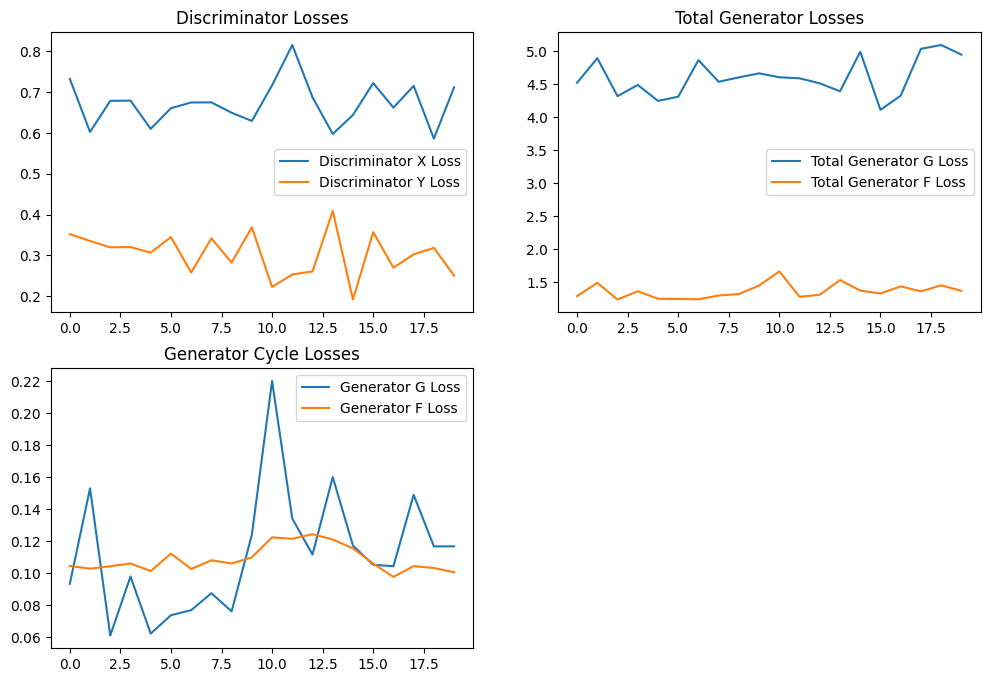

In [336]:
import matplotlib.pyplot as plt







# Plotting losses
def plot_losses(history):
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(history.history['disc_x_loss'], label='Discriminator X Loss')
    plt.plot(history.history['disc_y_loss'], label='Discriminator Y Loss')
    plt.legend()
    plt.title('Discriminator Losses')

    plt.subplot(2, 2, 2)
    plt.plot(history.history['total_gen_g_loss'], label='Total Generator G Loss')
    plt.plot(history.history['total_gen_f_loss'], label='Total Generator F Loss')
    plt.legend()
    plt.title('Total Generator Losses')

    plt.subplot(2, 2, 3)
    plt.plot(history.history['gen_g_loss'], label='Generator G Loss')
    plt.plot(history.history['gen_f_loss'], label='Generator F Loss')
    plt.legend()
    plt.title('Generator Cycle Losses')

    plt.show()

# Call the function to plot losses
plot_losses(history)


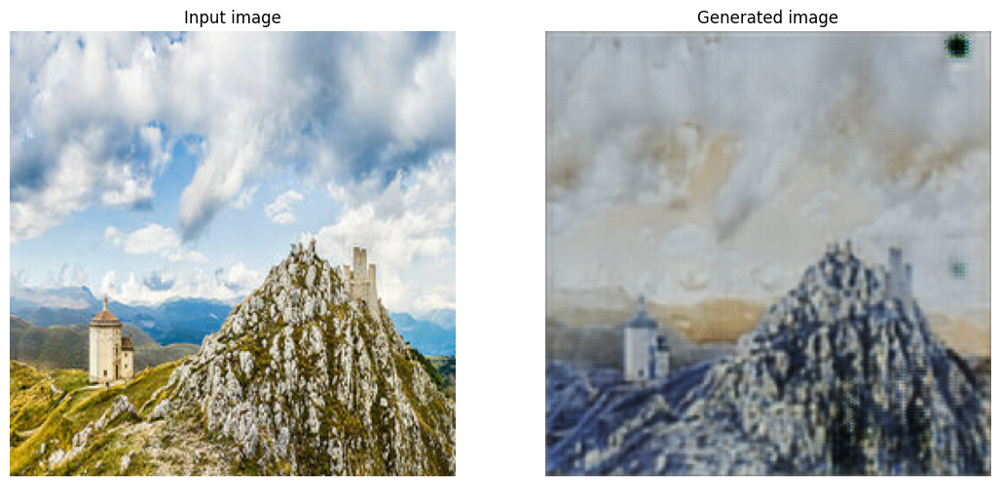

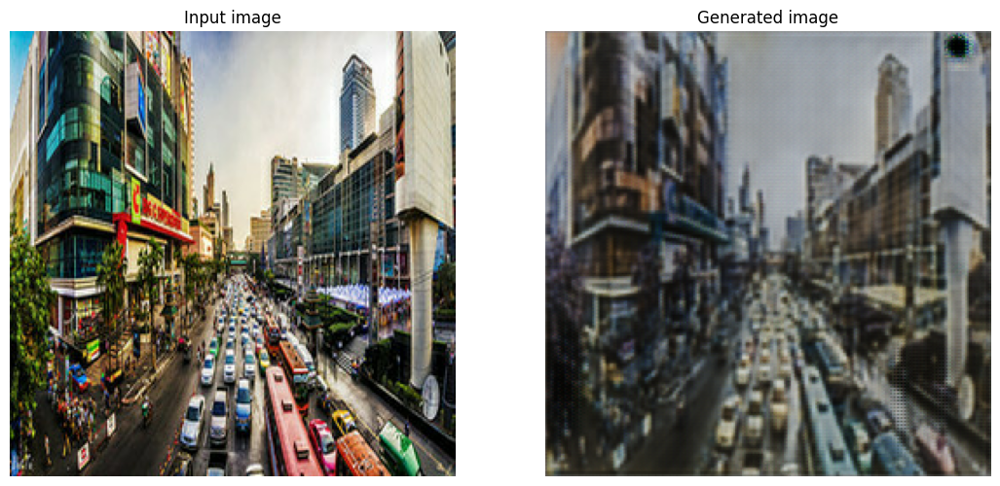

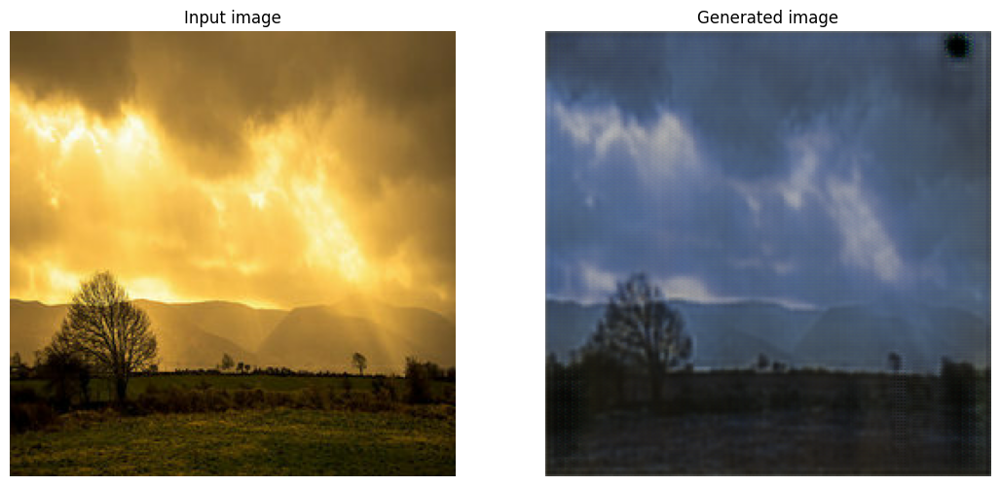

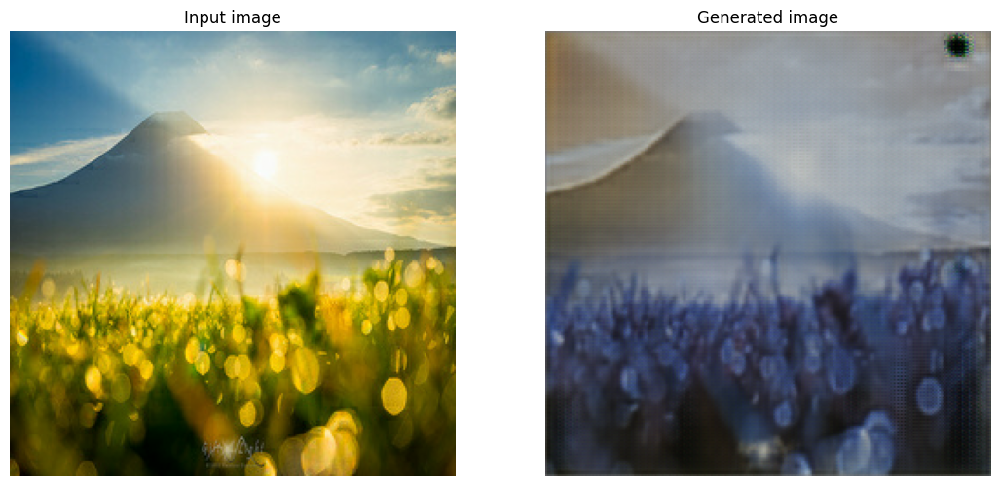

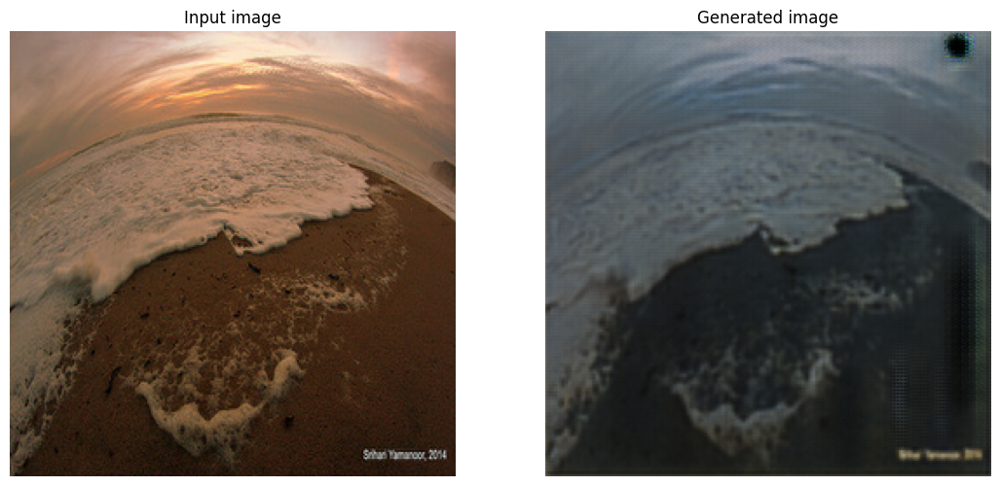

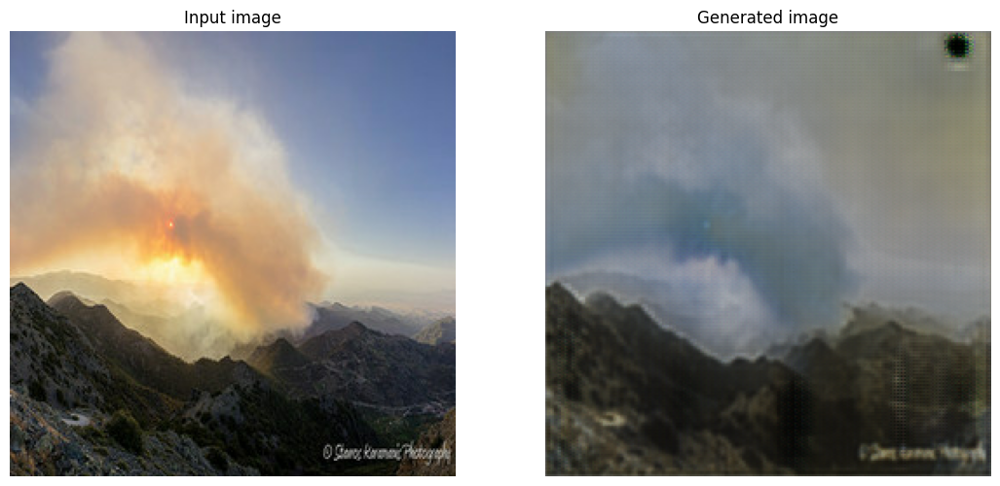

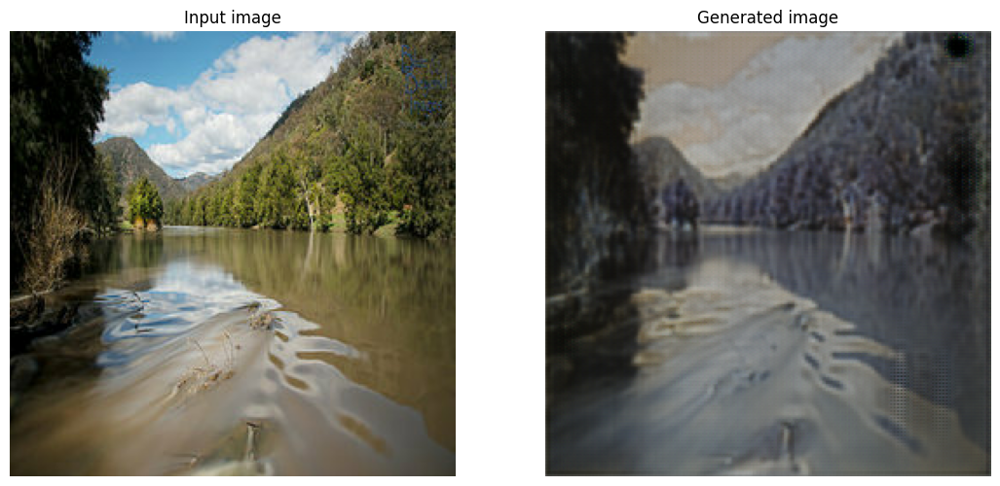

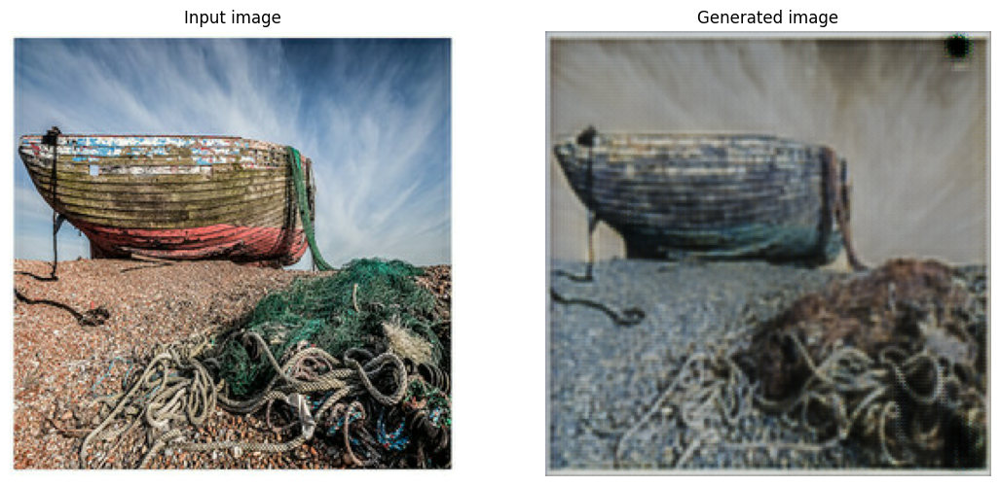

In [335]:
plot_predictions(generator_g, test_photo_ds.shuffle(1000))